# Рынок заведений общественного питания Москвы

# Введение

   Заказчик работы хочет открыть кофейню в Москве. Целью работы является анализ рынка общественного питания, для подтверждения категории заведения и выбора:
   
  - локации
  - ценовой политики

В работе применены методы исследовательского и статистического анализа.

# Обзор данных

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')
display(df.head(5))
df.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Датасет представляет собой 8406 записей об объектах общественного питания, их категории, локации, рэйтинге и др. 

Присутствуют пропуски в полях с:
- часами работы (hours)
- уровнем цен (price)
- диапозоном цен (avg_bill)
- средним чеком, или ценой капучино для кофеен(middle_avg_bill)
- цена чашки кофе (middle_coffee_cup)
- числе посадочных мест (seats)



# Предобработка данных

In [3]:
# добавляем колонку с улицей
df['street'] = df['address'].str.split(', ', expand=True)[1]
# добавляем колонку о круглосуточной работе
df['is_24/7'] = df['hours'] == df['hours'][8404]



# Анализ данных

## Категории объектов общественного питания

,категория заведения,количество заведений
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


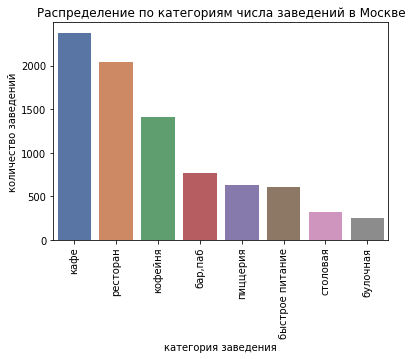

In [4]:
category = df.groupby(['category'], as_index = False)['name'].count().sort_values(by = 'name', ascending = False)
category = category.rename(columns = {'name' : 'количество заведений', 'category' : 'категория заведения'})
display(category)
sns.set_palette('deep')
sns.barplot(x = 'категория заведения' , y = 'количество заведений', data = category) 

plt.title('Распределение по категориям числа заведений в Москве')
plt.xticks(rotation=90)
plt.show()




Меньше всего (до 500 шт.) в Москве булочных и столовых.
Больше всего (более 1000 шт.) в Москве кафе, ресторанов и кофеен.

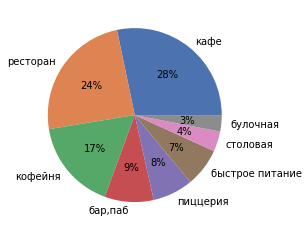

In [5]:

plt.pie(category['количество заведений'], labels = list(category['категория заведения']), autopct='%.0f%%')
#plt.title('Распределение заведений Москвы по категориям')
plt.show()


Число заведений в Топ3 по категориям составляет 69% от общего количества мест общепита в Москве:
- кафе - 28%
- ресторан - 24%
- кофейня - 17%

## Число посадочных мест

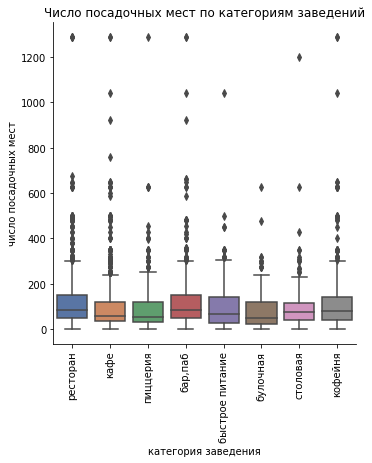

In [6]:
# убираем записи датасета с пропусками в поле с числом посадочных мест
seats_drop = df.dropna(subset = ['seats'])
seats_drop = seats_drop.rename(columns = {'seats' : 'число посадочных мест', 'category' : 'категория заведения'})

sns.catplot(x='категория заведения',
            y='число посадочных мест',
            kind = 'box',
            data=seats_drop) 
plt.xticks(rotation=90)
plt.title('Число посадочных мест по категориям заведений')
plt.show()

Видны выбросы в значениях чисел посадочных мест. Сравним медианные значения для каждой категории.

,число посадочных мест
категория заведения,
ресторан,86.0
"бар,паб",82.5
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


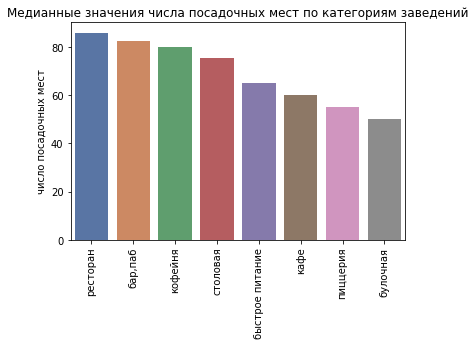

In [7]:
seats = seats_drop.pivot_table(index = 'категория заведения', values = 'число посадочных мест', aggfunc = 'median').sort_values(by = 'число посадочных мест', ascending = False)
display(seats)
sns.barplot(x = list(seats.index) , y = 'число посадочных мест', data = seats)
plt.title('Медианные значения числа посадочных мест по категориям заведений')
plt.xticks(rotation=90)
plt.show()


Больше всего посадочных мест в ресторанах (медианное значение 86)
Меньше всего посадочных мест в булочных (медианное значение 50)

## Доля сетевых заведений

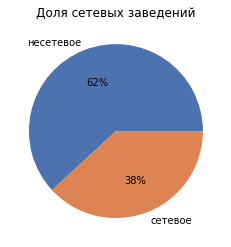

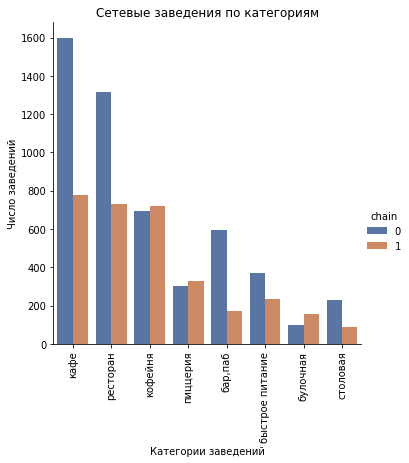

In [8]:
chain_total = df.pivot_table(index = 'chain', values = 'name', aggfunc = 'count')
plt.pie(chain_total['name'], labels = ['несетевое', 'сетевое'], autopct='%.0f%%')
plt.title('Доля сетевых заведений')
plt.show()

sns.catplot(x='category',
            hue='chain',
            kind='count',
            data=df);
plt.xlabel('Категории заведений')
plt.ylabel('Число заведений')
plt.xticks(rotation=90)
plt.title('Сетевые заведения по категориям')
plt.show()

Преобладают частные заведения, их 62% от общего количества.

При этом в категориях кофейня, пиццерия и булочная преобладают сетевые заведения.

## Топ-15 сетей

Всего у ТОП15 сетей 816 заведений.


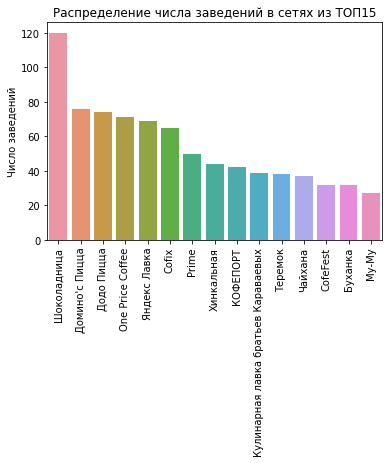

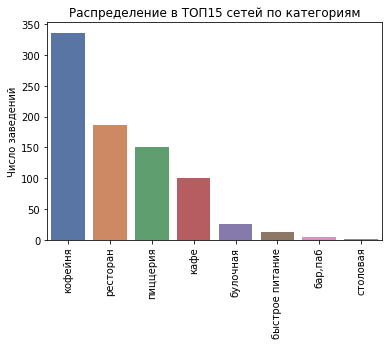

In [9]:

# ТОП15 сетей по количеству заведений
top15 = df[df['chain'] == 1].pivot_table(index ='name', values = 'lat', aggfunc = "count").sort_values(by = 'lat', ascending = False).head(15)
name_list = list(top15.index)
df_top15 = df.query('name in @name_list')
print('Всего у ТОП15 сетей', len(df_top15), 'заведений.')

# Категории в ТОП15
top15_category = df_top15.pivot_table(index = 'category', values = 'lat', aggfunc = 'count').sort_values(by = 'lat', ascending = False)

sns.barplot(x = list(top15.index) , y = 'lat', data = top15)
plt.ylabel('Число заведений')
plt.title('Распределение числа заведений в сетях из ТОП15')
plt.xticks(rotation=90)
plt.show()


sns.barplot(x = list(top15_category.index) , y = 'lat', data = top15_category) 
plt.ylabel('Число заведений')
plt.title('Распределение в ТОП15 сетей по категориям')
plt.xticks(rotation=90)
plt.show()

Первое место по числу заведений в ТОП15 с больши отрывом занимает Шоколадница.
Кофейня

### Распределение по районам

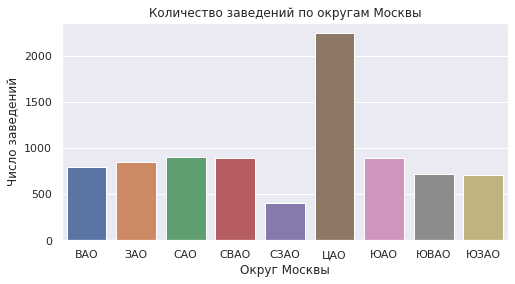

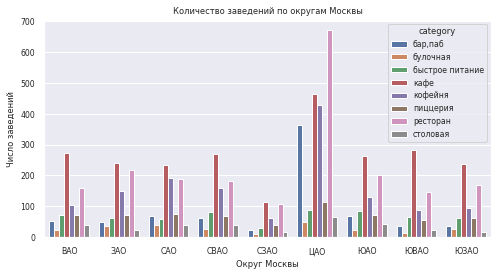

In [10]:
# заменим названия округов абривиатурами для лучшего отображения
df1=df.replace({'district':{'Северный административный округ':'САО',
       'Северо-Восточный административный округ':'СВАО',
       'Северо-Западный административный округ':'СЗАО',
       'Западный административный округ': 'ЗАО',
       'Центральный административный округ': 'ЦАО',
       'Восточный административный округ': 'ВАО',
       'Юго-Восточный административный округ':'ЮВАО',
       'Южный административный округ': 'ЮАО',
       'Юго-Западный административный округ':'ЮЗАО'}})

# распределение числа заведений по районам
r = df1.groupby(['district'], as_index = False)[['name']].count()
# то же, но с разбивкой по категориям заведений
q = df1.groupby(['district','category'], as_index = False)[['name']].count()



plt.figure(figsize=(8, 4))
sns.set (font_scale= 1 )
sns.barplot(x = 'district', y = 'name', data=r)
plt.xlabel('Округ Москвы')
plt.ylabel('Число заведений')
plt.title('Количество заведений по округам Москвы')
plt.show()

plt.figure(figsize=(8, 4))
sns.set (font_scale= 0.7 )
sns.barplot(x='district', y='name', data=q, hue='category')
plt.xlabel('Округ Москвы')
plt.ylabel('Число заведений')
plt.title('Количество заведений по округам Москвы')
plt.show()

По общему количеству заведений впереди всех ЦАО.
При этом в ЦАО преобладают рестораны, в отличии от остальных округов, где преобладают кафе.

## Средние рейтинги в категориях

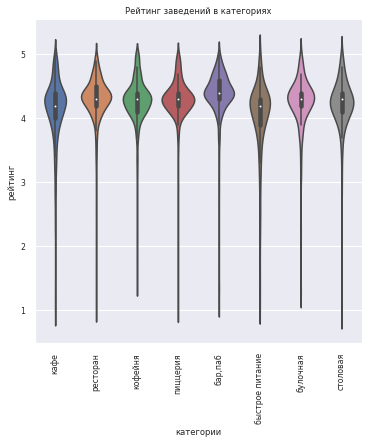

In [11]:

sns.catplot(data= df,
            x = 'category',
            y = 'rating',
            
            kind='violin');
plt.xlabel('категории')
plt.ylabel('рейтинг')
plt.title('Рейтинг заведений в категориях')
plt.xticks(rotation=90)
plt.show()

У заведений в Москве в среднем высокие рейтинги, больше 4.
При этом значения рейтингов между категориями близки.

### Рейтинг заведений по районам

In [12]:
# импортируем карту и хороплет
from folium import Map, Choropleth


rating = df.groupby(['district'], as_index = False)[['rating']].mean().sort_values(by = 'rating', ascending = False)
display(rating)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


Самый высокий медианный рейтинг у заведений в ЦАО - ~ 4.4

Самый низкий - в ЮВАО - ~ 4.1


### Все заведения на карте

In [13]:
# подключаем библиотеку
from folium import Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### ТОП15 улиц по количеству заведений

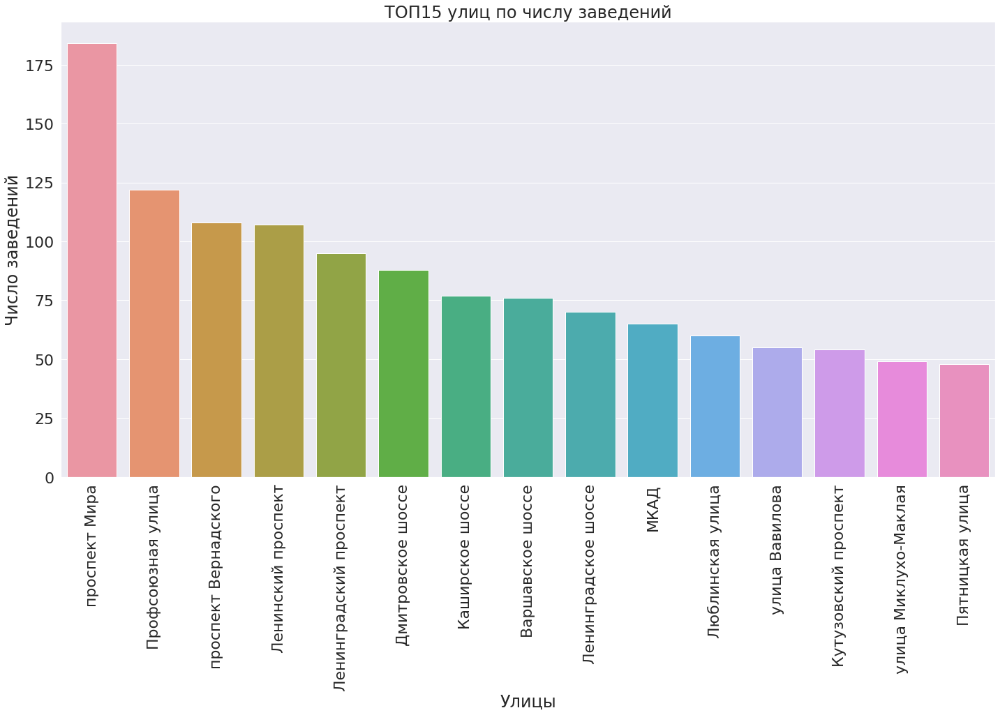

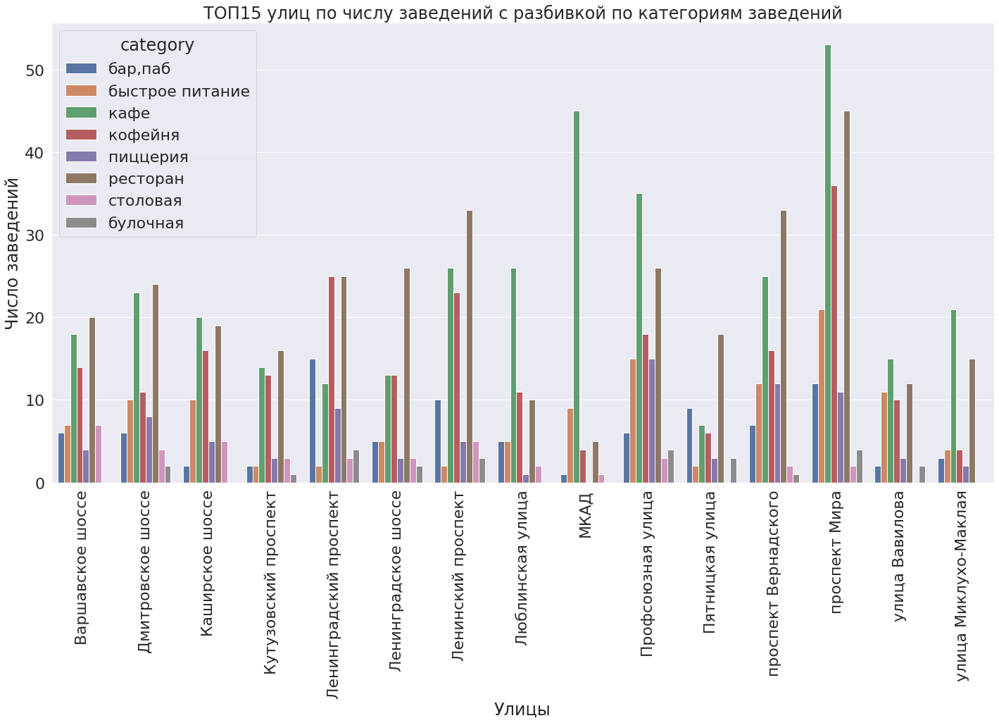

In [21]:
q = df.groupby(['street'], as_index = False)[['name']].count().sort_values(by = 'name', ascending = False).head(15)

plt.figure(figsize=(24, 12))
sns.set (font_scale= 2 )
sns.barplot(x = 'street', y = 'name', data=q)
plt.xlabel('Улицы')
plt.ylabel('Число заведений')
plt.title('ТОП15 улиц по числу заведений')
plt.xticks(rotation = 90)
plt.show()

street_list = list(q['street'])
df_top15 = df.query('street in @street_list')
r = df_top15.groupby(['street','category'], as_index = False)[['name']].count()
plt.figure(figsize=(24, 12))
sns.set (font_scale= 2 )
sns.barplot(x = 'street', y = 'name', data=r, hue='category')
plt.xlabel('Улицы')
plt.ylabel('Число заведений')
plt.title('ТОП15 улиц по числу заведений с разбивкой по категориям заведений')
plt.xticks(rotation = 90)
plt.show()

В ТОП15 по количеству заведений вошли магистрали. Исключение - Пятницкая улица, на которой преобладают рестораны.

### Улицы с единственным заведением

Всего в Москве 458 улиц с единственным заведением.


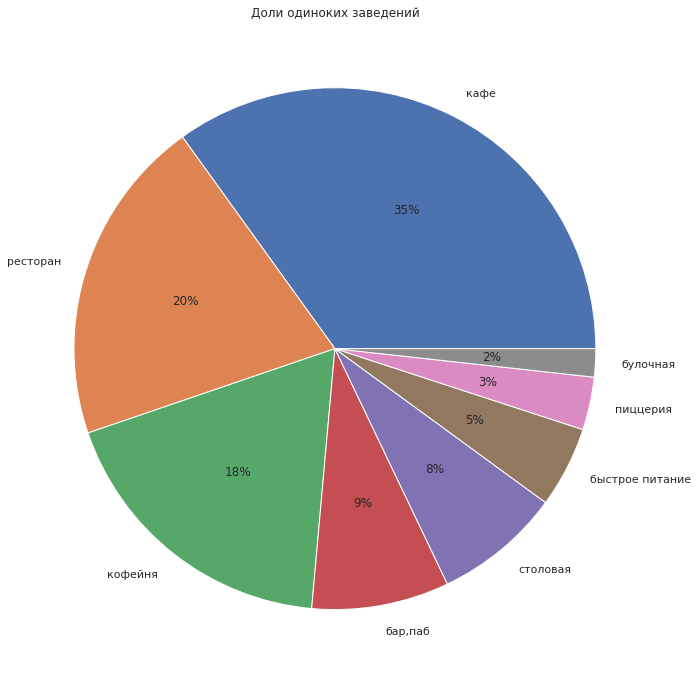

In [15]:
q = df.groupby(['street'], as_index = False)[['name']].count()
q = q[q['name']==1]
print('Всего в Москве', len(q), 'улиц с единственным заведением.')
b = q['street']
df_alone = df.query('street in @b')
q = df_alone.groupby(['category'], as_index = False)[['name']].count().sort_values(by = 'name', ascending = False)

plt.figure(figsize=(12,12))
sns.set (font_scale= 1 )
plt.pie(q['name'], labels = q['category'], autopct='%.0f%%')
plt.title('Доли одиноких заведений')
plt.show()

Видимо лучше всего себя чувствуют на улицах без других заведений кафе, рестораны и кофейни.



### Средний чек

In [16]:
print(len(df['middle_avg_bill']))
df_bill = df.dropna(subset = ['middle_avg_bill'])
len(df_bill['middle_avg_bill'])

q = df_bill.groupby(['district'], as_index = False)[['middle_avg_bill']].mean().sort_values(by = 'middle_avg_bill', ascending = False)
display(q)


# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=q,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианный средний чек в заведениях по районам',
).add_to(m)

# выводим карту
m

8406


,district,middle_avg_bill
5,Центральный административный округ,1191.057547
1,Западный административный округ,1053.225490
2,Северный административный округ,927.959627
8,Южный административный округ,834.398089
4,Северо-Западный административный округ,822.222930
0,Восточный административный округ,820.626923
7,Юго-Западный административный округ,792.561702
3,Северо-Восточный административный округ,716.611296
6,Юго-Восточный административный округ,654.097938


ТОП3 по среднему чеку ЦАО, ЗАО и САО.
Самый низкий средний чек в ЮВАО.

## Открытие кофейни

### Локации кофеен

In [17]:
print('Общее число кофеен в датасете',df1[df1['category'] == 'кофейня']['category'].count())

Общее число кофеен в датасете 1413


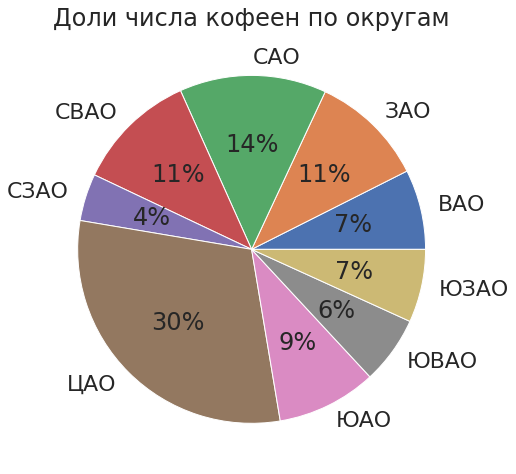

In [18]:
df_kofe = df1[df1['category'] == 'кофейня']
q = df_kofe.groupby(['district'], as_index = False)['name'].count()

plt.figure(figsize=(8, 8))
sns.set (font_scale= 2 )
plt.pie(q['name'], labels = q['district'], autopct='%.0f%%') #autopct='%.0f%%'
plt.title('Доли числа кофеен по округам')
plt.show()

### Рейтинг кофеен

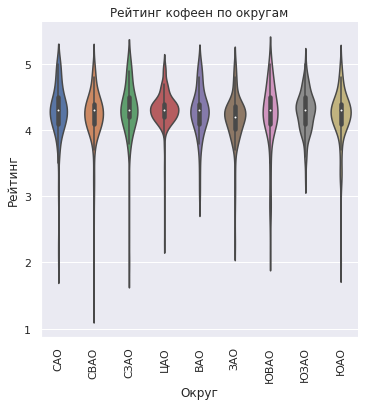

In [19]:
df_kofe = df1[df1['category'] == 'кофейня']
rating = df_kofe.groupby(['district'], as_index = False)[['rating']].mean()

sns.set (font_scale= 1 )
sns.catplot(data= df_kofe,
            x = 'district',
            y = 'rating',
            
            kind='violin');
plt.xlabel('Округ')
plt.ylabel('Рейтинг')
plt.title('Рейтинг кофеен по округам')
plt.xticks(rotation=90)
plt.show()

Рейтинги кофеен одинаково высоки во всех округах.

### Cтоимость чашки капучино в разных округах

In [20]:
df_kofe = df[df['category'] == 'кофейня']
kapuchino = df_kofe.dropna(subset = ['middle_coffee_cup'])
stoimost = kapuchino.groupby(['district'], as_index = False)['middle_coffee_cup'].median().sort_values(by = 'middle_coffee_cup', ascending = False)
display(stoimost)
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=stoimost,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки капучино в кофейнях по районам',
).add_to(m)

# выводим карту
m

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Кофе дороже всего в ЦАО, ЗАО и ЮЗАО.

# Вывод

1) Всего в Москве 8406 объектов общественного питания. Самые популярные в Москве категории заведений:  
    - кафе 
    - рестораны
    - кофейни
   Вместе они составляют 69% от всех заведений Москвы.

2) Рестораны, бары и кофейни имеют наибольшое число посадочных мест. Медианные значения:
    - рестораны - 86   мест
    - бары      - 82.5 мест
    - кофейни   - 80   мест
3) Сетевых заведений в Москве всего 38 %. Однако сети преобладают в кофейнях, пиццериях и булучных.

4) ТОП15 сетей имеют 816 заведений (~10% от общего количества заведений в Москве). Лидером среди сетевых заведений является кофейня "Шоколадница". 

5) Во всех категориях заведений медианный рейтинг выше 4.

   В ЦАО расположены заведения с самым высоким рейтингом. А в ЮВАО - с самым низким.
   
   Все улицы из ТОП15 по числу заведений являются магистралями, за исключением Пятницкой. На ней преобладают рестораны.
   
   На улицах с единственным заведением преобладают кафе, рестораны и кофейни.
   
   ТОП3 по среднему чеку ЦАО, ЗАО и САО. Самый низкий средний чек в ЮВАО.
   
6) Рейтинги кофеен одинаково высоки во всех округах.

   Больше всего коффен в ЦАО - 30%, далее идет САО -14%, затем СВАО - 11% и наконец ЗАО и ЮЗАО с 11 и 9 процентами соответственно.
   
   При этом наибольшая цена капучино в ЗАО,ЦАО, и ЮЗАО.

Для открытия кофейни может подойти ЗАО и ЮЗАО, учитывая сравнительно низкое количество кофеен и высокое медианное значение цены капучино (198р для ЮЗАО и 189р для ЗАО). Может подойти улица без других заведений. 

   

